Это тестовый файл, чтобы наглядно показывать этапы разработки

In [8]:
import cv2 
import os
import numpy as np
from io import BytesIO
import PIL
from IPython.display import display, Image
import matplotlib.pyplot as plt


In [2]:
def display_img_array(ima):
    """
    Посмотреть изображение
    """
    im = PIL.Image.fromarray(ima)
    bio = BytesIO()
    im.save(bio, format='png')
    display(Image(bio.getvalue(), format='png'))

In [3]:
path_test_images = 'E:\GitHub\AutoDoc\TestImages'

In [4]:
list_path_images = os.listdir(path_test_images)

In [5]:
list_path_images = [os.path.join(path_test_images, path) for path in list_path_images]

In [6]:
# тут читаю изобаржения
list_images = [cv2.imread(path_image) for path_image in list_path_images]

In [ ]:
for ima in list_images:
    display_img_array(ima)

Порог бинаризации 

по идеи надо использовать алгоритм Оцу для оценки гистограммы 
но пока воспользуюсь подбором 


In [12]:
def get_hist(image):
    histogram, bin_edges = np.histogram(image, bins=256)
    # plt.plot(bin_edges[0:-1], histogram) 
    ax = plt.hist(image.ravel(), bins = 256)
    plt.show()

In [13]:
def get_contour(image):
    img = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    img = image[...,0]
    get_hist(img)
    blur = cv2.GaussianBlur(img, (5, 5), 0)
    ret, thr = cv2.threshold(blur, 140, 255, cv2.THRESH_BINARY)
    
    return thr
    

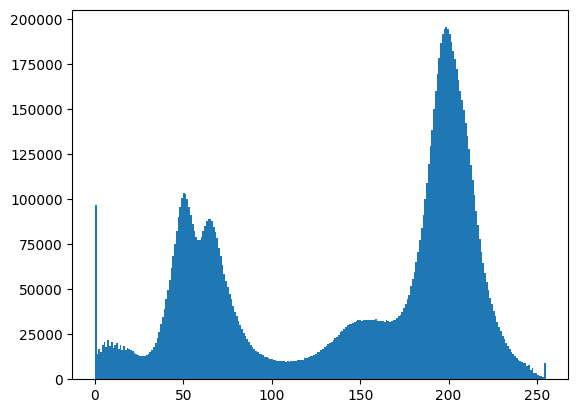

In [15]:
test = get_contour(list_images[10])

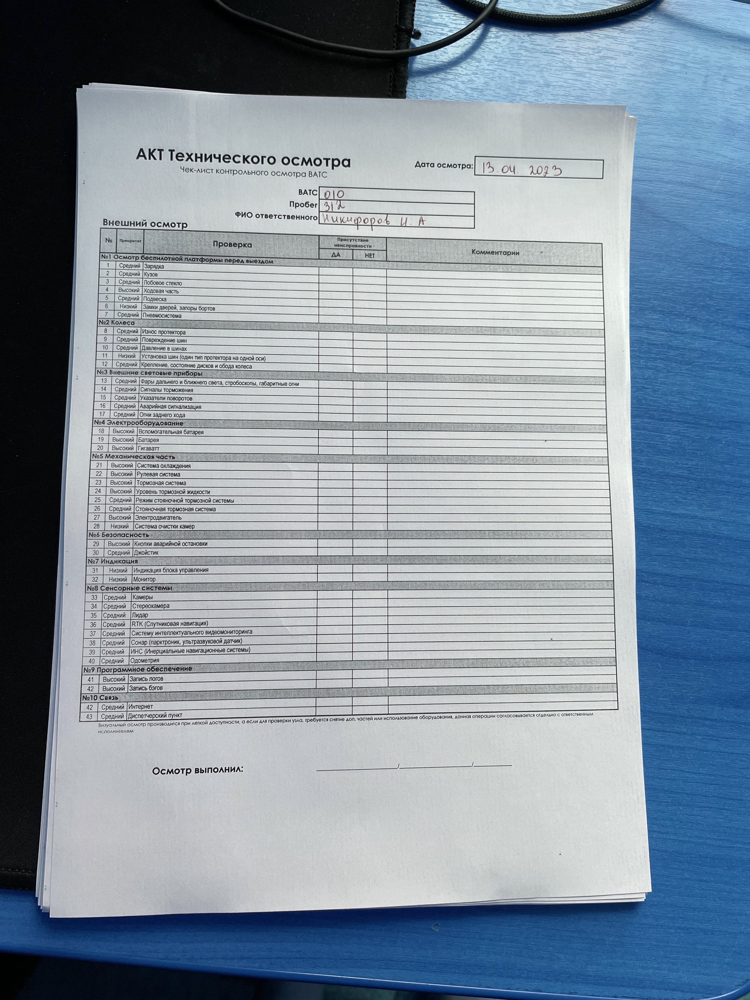

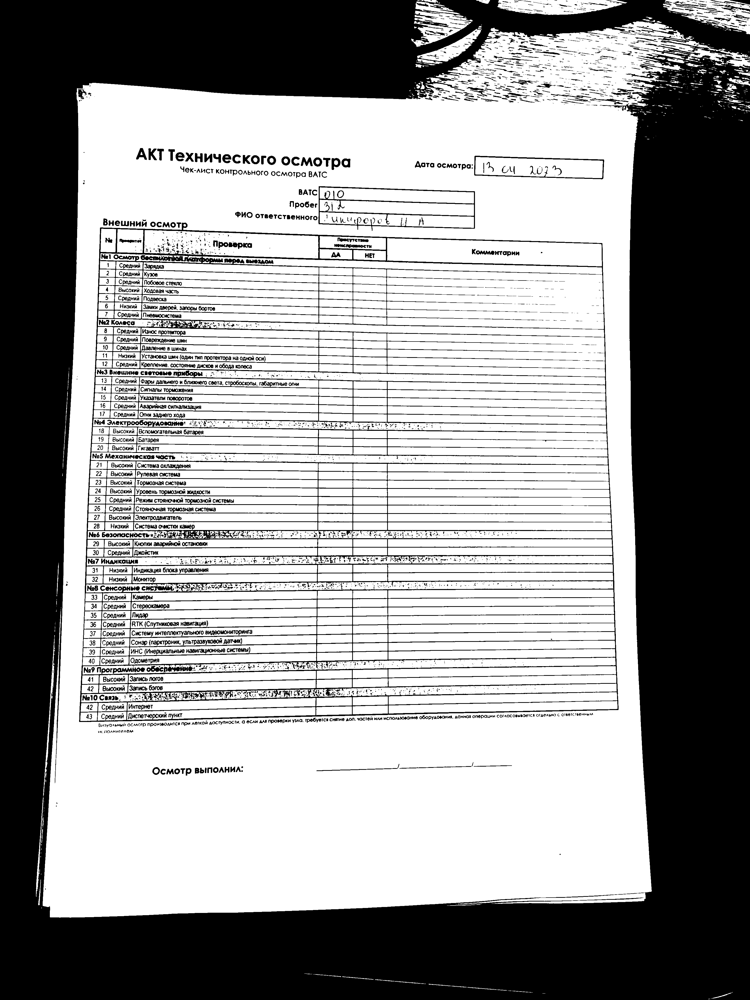

In [73]:
display_img_array(list_images[0])
display_img_array(test)

In [37]:
test.shape

(4032, 3024)

In [38]:
cv2.imshow('r', test)
cv2.waitKey(0)

-1